In [1]:
!pip install lightning grad-cam faiss-cpu pytorch-metric-learning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 56.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 828.5/828.5 kB 68.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.8/127.8 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 79.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 832.4/832.4 kB 75.1 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=ef8efd6d422150a81f0f5f7d50fe7a6860f68cf2fa8969effdd1d224334f4723
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [2]:
import torch
import zipfile
import random
import cv2
import matplotlib.pyplot as plt
import os
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import cv2
import torchvision.transforms as T
import torch.nn as nn
import lightning as L
import torchvision
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from PIL import Image
import torch.nn.functional as F
import faiss
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_metric_learning import samplers


In [3]:
!gdown --id 1PD-lbbcKSelDeAYKafe3boc5mqqEe7X7

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1PD-lbbcKSelDeAYKafe3boc5mqqEe7X7
To: /content/devkit.zip
100% 332k/332k [00:00<00:00, 5.20MB/s]


In [4]:
with zipfile.ZipFile("devkit.zip", "r") as zip_ref:
    zip_ref.extractall("devkit")

In [5]:
!cp -r ./devkit/devkit ./devkit_copy
!rm -rf devkit
!mv devkit_copy devkit
!rm devkit.zip

In [6]:
# !gdown --id 1l9EnYMC-xGX706SY1kN8RceMmFViASfx

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
with zipfile.ZipFile("./drive/MyDrive/archive.zip", "r") as zip_ref:
    zip_ref.extractall("archive")

In [9]:
!mv archive/cars_annos.mat .
!cp -r archive/cars_test/cars_test cars_test_copy
!cp -r archive/cars_train/cars_train cars_train_copy
!rm -rf archive
!mkdir archive/
!mv cars_annos.mat archive/
!mv cars_test_copy/ cars_test
!mv cars_train_copy/ cars_train
!cp -r cars_test archive/cars_test
!cp -r cars_train archive/cars_train
!rm -rf cars_test/
!rm -rf cars_train/
!rm -rf archive.zip

In [10]:
import scipy.io
ADD_PATH = './archive/cars_train'

mat = scipy.io.loadmat('./devkit/cars_train_annos.mat')
fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat['annotations'][0]['fname']],
                                                [i[0][0] for i in mat['annotations'][0]['class']])}
cars_meta = scipy.io.loadmat('./devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}

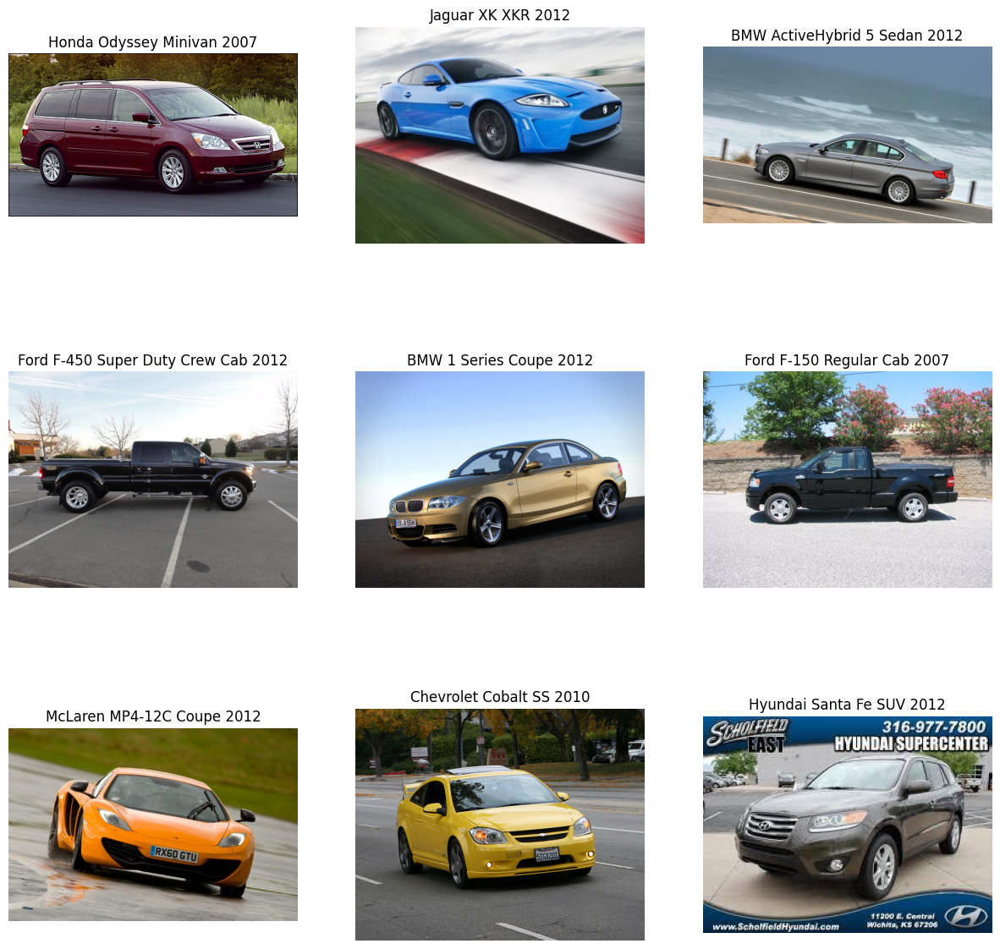

In [11]:
num_imgs = 9
cols = 3
rows = num_imgs // cols
fig, ax = plt.subplots(rows, cols, figsize = (15, 15))
for idx, im_idx in enumerate(random.sample([i for i in range(len(fname_to_class))], num_imgs)):
    filename, cl_id = list(fname_to_class.items())[im_idx]
    temp_image = cv2.imread(os.path.join(ADD_PATH, filename))
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
    ax[idx//cols][idx%cols].imshow(temp_image)
    ax[idx//cols][idx%cols].set_title(f'{id_to_car[cl_id]}')
    ax[idx//cols][idx%cols].axis('off')

In [12]:
default_transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class CarDataset(Dataset):
    def __init__(self, data, transforms=default_transforms):
        self.images_paths, self.labels = zip(*data)
        self.images_paths = [os.path.join(ADD_PATH, path) for path in self.images_paths]
        self.transforms = transforms

    def __getitem__(self, idx):
        with Image.open(self.images_paths[idx]) as img:
            image_rgb = img.convert("RGB")
            label = self.labels[idx]

            return {
                "images": self.transforms(image_rgb),
                "labels": torch.tensor(label, dtype=torch.long)
            }

    def __len__(self):
        return len(self.images_paths)

In [13]:
items = list(fname_to_class.items())
random.shuffle(items)
train_items = items[:int(len(items) * 0.8)]
val_items =  items[int(len(items) * 0.8):]


train_transforms = T.Compose([
    T.Resize((240, 240)),
    T.RandomCrop((224, 224)),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = CarDataset(train_items, train_transforms)
val_dataset = CarDataset(val_items)

In [14]:
train_labels = [train_dataset[i]['labels'].cpu().item() for i in range(len(train_dataset))]
val_labels = [val_dataset[i]['labels'].cpu().item() for i in range(len(val_dataset))]

m = 4
batch_size = 64

train_sampler = samplers.MPerClassSampler(
    labels=train_labels,
    m=m,
    length_before_new_iter=len(train_labels)
)

val_sampler = samplers.MPerClassSampler(
    labels=val_labels,
    m=m,
    length_before_new_iter=len(val_labels)
)

train_dataloader = DataLoader(
    train_dataset,
    sampler=train_sampler,
    batch_size=batch_size,
    pin_memory=True
)

val_dataloader = DataLoader(
    val_dataset,
    sampler=val_sampler,
    batch_size=batch_size,
    pin_memory=True
)

In [15]:
class Metrics:
    def __init__(self, embeddings, labels):
        self.embeddings = embeddings.to("cpu").numpy().astype(np.float32)
        self.labels = labels.to("cpu").numpy()
        dim = self.embeddings.shape[1]

        self.index = faiss.IndexFlatL2(dim)
        self.index.add(self.embeddings)

    @torch.no_grad()
    def precision_at_k(self, k):
        _, I = self.index.search(self.embeddings, k + 1)
        I = I[:, 1:]

        predicted_labels = self.labels[I]
        n_relevants = np.array([
            np.sum(predicted_labels[i] == label) for i, label in enumerate(self.labels)
        ])

        mean_precision = (n_relevants / k).mean()
        return mean_precision

    @torch.no_grad()
    def recall_at_k(self, k):
        _, I = self.index.search(self.embeddings, k + 1)
        I = I[:, 1:]

        predicted_labels = self.labels[I]
        n_relevants = np.array([
            np.sum(predicted_labels[i] == label) for i, label in enumerate(self.labels)
        ])

        unique_labels, counts = np.unique(self.labels, return_counts=True)
        label_to_count = dict(zip(unique_labels, counts))
        all_relevants = np.array([label_to_count[label] - 1 for label in self.labels])
        all_relevants = np.maximum(all_relevants, 1)

        mean_recall = (n_relevants / all_relevants).mean()
        return mean_recall

    @torch.no_grad()
    def average_precision(self):
        N = self.index.ntotal
        _, I = self.index.search(self.embeddings, N)
        I = I[:, 1:]

        predicted_labels = self.labels[I]
        relevant = (predicted_labels == self.labels[:, None]).astype(np.float32)

        positions = np.arange(1, N, dtype=np.float32)
        precision_at_i = np.cumsum(relevant, axis=1) / positions

        unique_labels, counts = np.unique(self.labels, return_counts=True)
        label_to_count = dict(zip(unique_labels, counts))
        total_relevant = np.array([label_to_count[label] - 1 for label in self.labels])
        total_relevant = np.maximum(total_relevant, 1)

        ap = (precision_at_i * relevant).sum(axis=1) / total_relevant
        return ap

    @torch.no_grad()
    def mean_average_precision(self):
        ap_scores = self.average_precision()
        return float(np.nanmean(ap_scores))

    def report(self):
        max_k = min(10, len(self.embeddings) - 1)
        for k in range(1, max_k + 1):
            print(f"Precision@{k}: {self.precision_at_k(k):.4f}")
            print(f"Recall@{k}:    {self.recall_at_k(k):.4f}")
        print("=" * 20)
        print(f"mAP: {self.mean_average_precision():.4f}")

In [16]:
from pytorch_metric_learning.miners import TripletMarginMiner
from pytorch_metric_learning.distances import LpDistance
from pytorch_metric_learning.losses import TripletMarginLoss

class CarEmbedder(L.LightningModule):
    def __init__(self, margin=1.0, k=10):
        super().__init__()
        self.margin = margin
        self.model = torchvision.models.efficientnet_b0(weights='DEFAULT')
        self.model.classifier = nn.Identity()

        self.miner = TripletMarginMiner(
            margin=margin,
            type_of_triplets="semihard",
        )

        self.k = 10

        self.validation_outputs = []
        self.validation_labels = []

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch['images'], batch['labels']
        embeddings = self(images)

        anchors, positives, negatives = self.miner(embeddings, labels)

        loss = F.triplet_margin_loss(
            embeddings[anchors],
            embeddings[positives],
            embeddings[negatives],
            margin=self.margin
        )
        self.log("train_loss", loss, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return [optimizer]

    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        images, labels = batch['images'], batch['labels']
        embeddings = self(images)
        return embeddings, labels

    def on_validation_epoch_start(self):
        self.validation_outputs.clear()
        self.validation_labels.clear()

    def validation_step(self, batch, batch_idx):
        images, labels = batch['images'], batch['labels']
        embeddings = self(images)

        anchors, positives, negatives = self.miner(embeddings, labels)

        loss = F.triplet_margin_loss(
            embeddings[anchors],
            embeddings[positives],
            embeddings[negatives],
            margin=self.margin
        )
        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)

        embeddings = embeddings
        self.validation_outputs.append(embeddings.detach().cpu())
        self.validation_labels.append(labels.detach().cpu())

    def on_validation_epoch_end(self):
        embeddings = torch.cat(self.validation_outputs)
        labels = torch.cat(self.validation_labels)
        embeddings = F.normalize(embeddings, dim=1)

        scorer = Metrics(embeddings, labels)
        self.log(f"val_precision@{self.k}", scorer.precision_at_k(self.k))
        self.log(f"val_recall@{self.k}", scorer.recall_at_k(self.k))
        self.log(f"val_mAP@{self.k}", scorer.mean_average_precision())

In [17]:
model = CarEmbedder()

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 88.3MB/s]


In [18]:
print(f"Model has {sum([p.numel() for p in model.parameters() if p.requires_grad])} trainable parameters")

Model has 4007548 trainable parameters


In [19]:
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=0.00,
    patience=5,
    mode="min"
)

trainer = L.Trainer(
    accelerator="gpu",
    devices=1,
    precision=32,
    max_epochs=10,
    callbacks=[early_stop_callback],
)

trainer.fit(model, train_dataloader, val_dataloader)

INFO: 💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:lightning.pytorch.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name  | Type        

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [20]:
# !rm -rf /content/lightning_logs

In [21]:
%reload_ext tensorboard
%tensorboard --logdir=/content/lightning_logs/

Output hidden; open in https://colab.research.google.com to view.

In [22]:
predictions = trainer.predict(model, val_dataloader)

embeddings_list = [p[0] for p in predictions]
labels_list = [p[1] for p in predictions]

embeddings = torch.cat(embeddings_list, dim=0)
labels = torch.cat(labels_list, dim=0)

print(embeddings.shape)
print(labels.shape)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

torch.Size([1568, 1280])
torch.Size([1568])


In [23]:
metrics = Metrics(embeddings, labels)
metrics.report()

Precision@1: 0.7168
Recall@1:    0.1024
Precision@2: 0.5494
Recall@2:    0.1570
Precision@3: 0.4747
Recall@3:    0.2034
Precision@4: 0.4193
Recall@4:    0.2396
Precision@5: 0.3759
Recall@5:    0.2685
Precision@6: 0.3424
Recall@6:    0.2935
Precision@7: 0.3191
Recall@7:    0.3191
Precision@8: 0.2983
Recall@8:    0.3409
Precision@9: 0.2772
Recall@9:    0.3564
Precision@10: 0.2619
Recall@10:    0.3741
mAP: 0.3671


In [46]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406], device=tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225], device=tensor.device)
    tensor = tensor.clone() * std[:, None, None] + mean[:, None, None]
    return tensor

class CosineSimilarity:
    def __init__(self, target_embedding):
        self.target_embedding = target_embedding

    def __call__(self, model_output):
        cos_sim = F.cosine_similarity(model_output, self.target_embedding, dim=1)
        return cos_sim


def find_and_show_similar_with_gradcam(model, dataset, query_idx, k=5, batch_size=32, id_to_car=None):
    device = next(model.parameters()).device
    model.eval()

    query_img = dataset[query_idx]['images']
    query_label = dataset[query_idx]['labels']
    query_tensor = query_img.unsqueeze(0).to(device)

    with torch.no_grad():
        query_embed = model(query_tensor)

    all_embeds = []
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    with torch.no_grad():
        for batch in loader:
            imgs = batch['images']
            embeds = model(imgs.to(device))
            all_embeds.append(embeds)
    all_embeds = torch.cat(all_embeds)

    distances = torch.norm(all_embeds - query_embed, dim=1)
    sorted_indices = torch.argsort(distances)
    top_k_indices = sorted_indices[1:k + 1].cpu().numpy()

    target_layers = [model.model.features[-1]]
    cam_target = CosineSimilarity(query_embed)

    fig, axes = plt.subplots(2, k + 1, figsize=(3 * (k + 1), 6))
    all_indices = [query_idx] + list(top_k_indices)

    with GradCAM(model=model, target_layers=target_layers) as cam:
        for i, idx in enumerate(all_indices):
            img = dataset[idx]['images']
            label = dataset[idx]['labels']
            input_tensor = img.unsqueeze(0).to(device)

            grayscale_cam = cam(input_tensor=input_tensor, targets=[cam_target])[0, :]
            rgb_img = denormalize(img).permute(1, 2, 0).cpu().numpy()
            cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

            axes[0, i].imshow(rgb_img)
            axes[0, i].axis('off')
            axes[1, i].imshow(cam_overlay)
            axes[1, i].axis('off')

            title = "Query" if i == 0 else f"Top {i}"
            if id_to_car and label in id_to_car:
                title += f"\n{id_to_car[label]}"
            axes[0, i].set_title(title, fontsize=9)

    plt.tight_layout()
    plt.show()

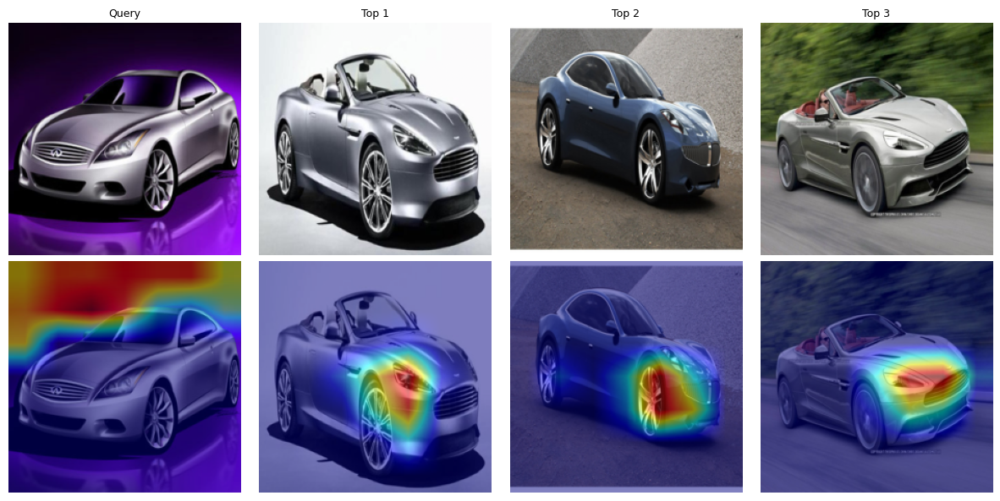

In [47]:
random_idx = random.randint(0, len(val_dataset) - 1)
find_and_show_similar_with_gradcam(model, val_dataset, random_idx, k=3)